In [1]:
from fastai.tabular.all import *
from transfertab.utils import *
from transfertab.transfer import *
from transfertab.extract import *
from fastcore.xtras import *
from fastai.learner import *
import torch
import numpy as np
from fastai.interpret import *

In [2]:
import pandas as pd
df = pd.read_csv("bank-additional-full.csv")

In [3]:
df.head()

  age;"job";"marital";"education";"default";"housing";"loan";"contact";"month";"day_of_week";"duration";"campaign";"pdays";"previous";"poutcome";"emp.var.rate";"cons.price.idx";"cons.conf.idx";"euribor3m";"nr.employed";"y"
0                                                                                        56;"housemaid";"married";"basic.4y";"no";"no";"no";"telephone";"may";"mon";261;1;999;0;"nonexistent";1.1;93.994;-36.4;4.857;5191;"no"
1                                                                                 57;"services";"married";"high.school";"unknown";"no";"no";"telephone";"may";"mon";149;1;999;0;"nonexistent";1.1;93.994;-36.4;4.857;5191;"no"
2                                                                                     37;"services";"married";"high.school";"no";"yes";"no";"telephone";"may";"mon";226;1;999;0;"nonexistent";1.1;93.994;-36.4;4.857;5191;"no"
3                                                                                           40;"admin.";"mar

In [4]:
import pandas as pd
df = pd.read_csv("bank-additional-full.csv", delimiter=';')

In [5]:
df.head()

   age        job  marital    education  default housing loan    contact  \
0   56  housemaid  married     basic.4y       no      no   no  telephone   
1   57   services  married  high.school  unknown      no   no  telephone   
2   37   services  married  high.school       no     yes   no  telephone   
3   40     admin.  married     basic.6y       no      no   no  telephone   
4   56   services  married  high.school       no      no  yes  telephone   

  month day_of_week  ...  campaign  pdays  previous     poutcome emp.var.rate  \
0   may         mon  ...         1    999         0  nonexistent          1.1   
1   may         mon  ...         1    999         0  nonexistent          1.1   
2   may         mon  ...         1    999         0  nonexistent          1.1   
3   may         mon  ...         1    999         0  nonexistent          1.1   
4   may         mon  ...         1    999         0  nonexistent          1.1   

   cons.price.idx  cons.conf.idx  euribor3m  nr.employed

In [6]:
df.shape

(41188, 21)

In [7]:
41188 * 0.3

12356.4

In [8]:
41188 * 0.7

28831.6

In [9]:
dfA = df.iloc[0:28831]
dfB = df.iloc[28831:-1]

In [10]:
dfA.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [11]:
contcols = ['age', 'duration', 'campaign', 'pdays',
       'previous', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y']
catcols = ['job', 'marital', 'education', 'default', 'housing', 'loan','contact', 
	'month', 'day_of_week','poutcome']
target = 'y'

In [12]:
contcols = ['age', 'duration', 'campaign', 'pdays',
       'previous', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed']
catcols = ['job', 'marital', 'education', 'default', 'housing', 'loan','contact', 
	'month', 'day_of_week','poutcome']
target = 'y'

In [13]:
splitsA = RandomSplitter(valid_pct=0.2)(range_of(dfA))
toA = TabularPandas(dfA, procs=[Categorify, FillMissing, Normalize],
                   cat_names=catcols,
                   cont_names=contcols,
                   y_names='Total Costs',
                   splits=splitsA)
dlsA = toA.dataloaders(bs=512)
learnA = tabular_learner(dlsA, metrics=accuracy)

In [14]:
splitsA = RandomSplitter(valid_pct=0.2)(range_of(dfA))
toA = TabularPandas(dfA, procs=[Categorify, FillMissing, Normalize],
                   cat_names=catcols,
                   cont_names=contcols,
                   y_names=target,
                   splits=splitsA)
dlsA = toA.dataloaders(bs=512)
learnA = tabular_learner(dlsA, metrics=accuracy)

In [15]:
# cbs=[WandbCallback(log="all", dataset_name="health2011", n_preds=128, seed=1), SaveModelCallback()]
learnA.fit_one_cycle(5)

In [16]:
learnA.fit_one_cycle(5)

In [17]:
# cbs=[WandbCallback(log="all", dataset_name="health2011", n_preds=128, seed=1), SaveModelCallback()]
learnA.fit_one_cycle(20)

In [18]:
splitsA = RandomSplitter(valid_pct=0.2)(range_of(dfA))
toA = TabularPandas(dfA, procs=[Categorify, FillMissing, Normalize],
                   cat_names=catcols,
                   cont_names=contcols,
                   y_names=target,
                   splits=splitsA)
dlsA = toA.dataloaders(bs=512)
learnA = tabular_learner(dlsA, metrics=accuracy)

In [19]:
# cbs=[WandbCallback(log="all", dataset_name="health2011", n_preds=128, seed=1), SaveModelCallback()]
learnA.fit_one_cycle(30)

In [20]:
import wandb
from fastai.callback.wandb import *

In [21]:
wandb.init(
    project='transfertab', 
    save_code=True, 
    group='Exp4c', 
    job_type='basetrain', 
    tags=['base', 'bank'], 
    name='modelA training',
    notes="Training modelA from which we'll take embeddings",
    reinit=True
)

In [22]:
splitsA = RandomSplitter(valid_pct=0.2)(range_of(dfA))
toA = TabularPandas(dfA, procs=[Categorify, FillMissing, Normalize],
                   cat_names=catcols,
                   cont_names=contcols,
                   y_names=target,
                   splits=splitsA)
dlsA = toA.dataloaders(bs=512)
learnA = tabular_learner(dlsA, metrics=accuracy)

In [23]:
cbs=[WandbCallback(log="all", dataset_name="bank-additional-full (first .7)", n_preds=128, seed=1), SaveModelCallback()]
learnA.fit_one_cycle(50)

epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01
9,0.162368,0.124458,0.951266,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01
9,0.162368,0.124458,0.951266,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01
9,0.162368,0.124458,0.951266,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01
9,0.162368,0.124458,0.951266,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01
9,0.162368,0.124458,0.951266,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01
9,0.162368,0.124458,0.951266,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01
9,0.162368,0.124458,0.951266,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01
9,0.162368,0.124458,0.951266,00:01


epoch,train_loss,valid_loss,accuracy,time
0,0.678593,0.712309,0.552376,00:01
1,0.646635,0.611967,0.848075,00:01
2,0.622158,0.589523,0.883975,00:01
3,0.592721,0.551455,0.909469,00:00
4,0.548390,0.476280,0.921956,00:01
5,0.476547,0.368487,0.933576,00:01
6,0.375482,0.260133,0.946930,00:01
7,0.275182,0.179294,0.946757,00:01
8,0.204287,0.130728,0.954561,00:01
9,0.162368,0.124458,0.951266,00:01


In [24]:
splitsA = RandomSplitter(valid_pct=0.2)(range_of(dfA))
toA = TabularPandas(dfA, procs=[Categorify, FillMissing, Normalize],
                   cat_names=catcols,
                   cont_names=contcols,
                   y_names=target,
                   splits=splitsA)
dlsA = toA.dataloaders(bs=512)
learnA = tabular_learner(dlsA, metrics=accuracy)

In [25]:
cbs=[WandbCallback(log="all", dataset_name="bank-additional-full (first .7)", n_preds=128, seed=1), SaveModelCallback()]
learnA.fit_one_cycle(50, cbs=cbs)

epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.749303,0.649875,0.763094,00:02
1,0.718157,0.684830,0.789109,00:06
2,0.692475,0.654220,0.857614,00:06
3,0.661029,0.621325,0.871315,00:06
4,0.612372,0.545851,0.903746,00:06
5,0.530301,0.415358,0.939473,00:06
6,0.413513,0.269495,0.944676,00:06
7,0.294984,0.184901,0.953174,00:06
8,0.213285,0.155507,0.945890,00:06
9,0.166619,0.147200,0.942768,00:06


In [26]:
learnA.recorder.plot_loss()

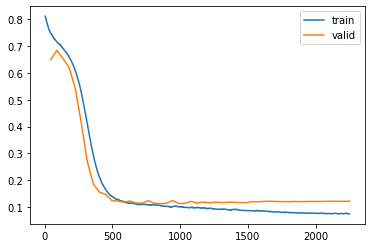

In [27]:
torch.save(learnA.model.state_dict(),"modelA_state_dict")

In [28]:
catdict = {col:list(learnA.dls.categorify.classes[col]) for col in catcols}

In [29]:
extractembeds(learnA.model, catdict, transfercats=catcols, allcats=catcols, path="learnA_extracts", kind="json")

{'job': {'classes': ['#na#',
   'admin.',
   'blue-collar',
   'entrepreneur',
   'housemaid',
   'management',
   'retired',
   'self-employed',
   'services',
   'student',
   'technician',
   'unemployed',
   'unknown'],
  'embeddings': [[0.008318760432302952,
    0.00441267155110836,
    -0.007023473735898733,
    -0.012475866824388504,
    0.0151326023042202,
    0.017301613464951515,
    0.00042546517215669155],
   [-0.015240681357681751,
    -0.01095271110534668,
    0.03314436599612236,
    -0.08949369937181473,
    -0.03206564858555794,
    -0.001056714914739132,
    0.002649565227329731],
   [0.09490272402763367,
    0.030090143904089928,
    0.08460000902414322,
    -0.04267774149775505,
    -0.016363419592380524,
    -0.03613348305225372,
    0.045366402715444565],
   [-0.02455057203769684,
    -0.047547582536935806,
    -0.08470889180898666,
    0.05608623847365379,
    0.013738198205828667,
    -0.08698925375938416,
    0.03591616451740265],
   [0.011158350855112076,
    

In [30]:
wandb.finish()